# 1D Glacier soliton

Here we take our normal glacier and at some specified time impose a b=0 climate meant to mimic a rock glacier (bs = 0) and a shutdown of the net accumulation in the avalanche zone (hence b=0 everywhere)

Ice dynamics takes over and we get drooling of the ice mass down valley, thinning as it goes.

In the end of the file I take this to an extreme and craft a mostly analytic solution for a simple slab glacier on a uniform slope... and guess what?  It just extends till it is going so slowly it would be imperceptible...but it takes many hundreds to thousands of years to do so... so there is a LONG memory of the climatic loading of the ice mass...

Utilizes the stress profile that allows a rocky cap and the rock in the icy core to weigh down the ice
and a separate calculation to then evaluate the speed profile and its integral Q. It is this case (toggle = 2) that is used in the models presented in the Sopris paper.

Written by RSA starting July 2023

In [273]:
# Import required libraries

import numpy
import pylab
import random
import pandas as pd

import matplotlib
import matplotlib.animation as manimation

print(matplotlib.__version__)

#FFMpegWriter = manimation.writers['ffmpeg']
metadata = dict(title='Movie 1D Oscillating glacier', artist='Matplotlib',
                comment='1D glacier oscillator')
#writer = FFMpegWriter(fps=15, metadata=metadata)
#writer = FFMpegWriter(fps=8, bitrate=5000, metadata=metadata)
writer = manimation.FFMpegWriter(fps=8, metadata=metadata, bitrate=5000)

import matplotlib.axes as axes
degree = u"\u00b0" # unicode symbol for degree for labeling plots nicely
      
import matplotlib as plt
import matplotlib.pyplot as plt
import matplotlib as mpl

from matplotlib.pyplot import cm

# Import time module
import time

plt.rcParams['animation.ffmpeg_path'] = 'ffmpeg'

mpl.rcParams['pdf.fonttype'] = 42 # use to make sure exported pdf's have editable text
dpi_movie = 400
mpl.rcParams['figure.dpi'] = dpi_movie

print('modules imported')

3.7.1
modules imported


In [274]:
start = time.time()
# user defined variables and parameters

g = 9.81 # gravitational acceleration in m/s2

# ice rheology
rho_i = 917 # density of ice in kg/m3

rho_rock = 2750 # density of rock in the cap
C_rock = 0.7 # concentration of rock in the cap
C_rock_core = 0.0 # concentration of rock in the deforming ice-dominated core

#A = 6.28e-24 # Glen's flow law parameter Pa-3 sec-1; used in feb 2017 runs on rock glaciers
A = 2.4e-24 # consistent with Ben's code for extracting thickness from the rock glacier
A0 = A * 365*24*3600 # converts to year timescales Pa-3 yr-1

Enhance = 3 # allows us to incorporate enhancement of deformation to accommodate high dust concentration
A = A0 * Enhance

n = 3.0  # Glen's flow law power


In [275]:
A/(365*24*3600)

7.199999999999999e-24

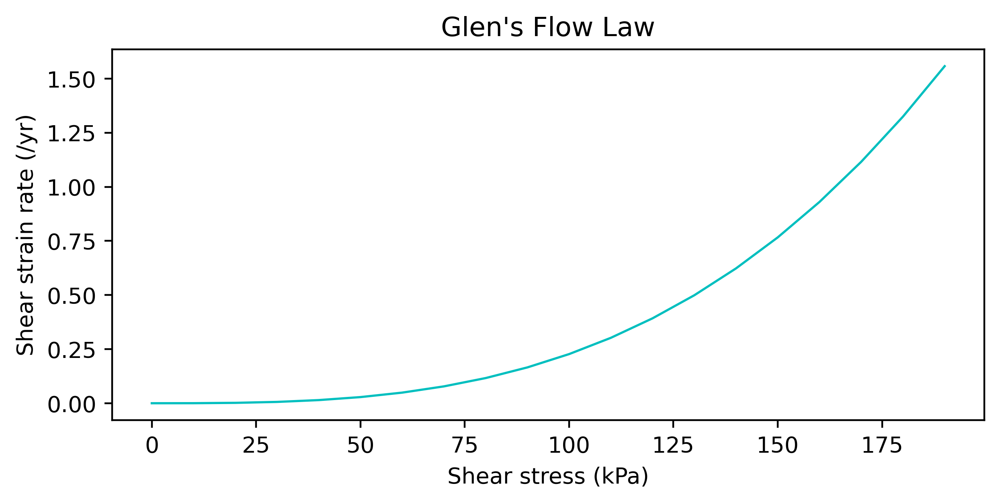

In [276]:
# Visualize Glen's flow law describing rheology of ice

dtau_test = 1.0e4
tau_test_max = 2.0e5

tau_test = numpy.arange(0,tau_test_max, dtau_test) # array of shear stresses

dudz_test = A * (tau_test**n) # shear strain rates here in 1/yr

fig1 = plt.figure()
#ax = plt.axes()
plt.rcParams["figure.figsize"] = (3,3) # (w, h)
pylab.plot(tau_test/1e3,dudz_test,'c',linewidth=1)

pylab.xlabel('Shear stress (kPa)',fontsize=10)
pylab.ylabel('Shear strain rate (/yr)',fontsize=10)
pylab.title("Glen's Flow Law",fontsize = 12)
pylab.show()

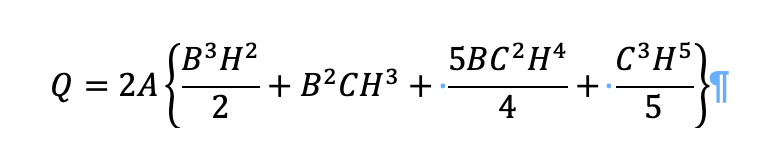

where B = shear stress associated with the debris cover layer and C = rhoi*g*S
Please see my file called "The role of debris in speeds of rock glaciers"

This is what I use if the toggle_rock is set to 2 or higher.


In [277]:
# Initialize distance and time arrays

# distances
xmax = 2500.0  # length of domain, m
dx = 25.0     # distance interval, m
x = numpy.arange(0, xmax+dx, dx)
x_edge = (0.5*x[0:-1])+(0.5*x[1:]) # inner edges of cells
    
arrow_indeces= [0.2*xmax/dx,0.4*xmax/dx,0.6*xmax/dx]

# time arrays... all times in years
ela_period = 12000

dt = 0.01
#tmax = 3.5*ela_period
tmax = 12000
t = numpy.arange(0, tmax+dt, dt)
imax = t.size
nplots = 200
tplot = tmax/nplots

nplots2 = 50
tplot2 = tmax/nplots2


tplot

imax,tplot

(1200001, 60.0)

In [278]:
arrow_indeces=numpy.int_(arrow_indeces)
arrow_indeces

array([20, 40, 60])

In [279]:
# Initial conditions

# bedrock topography (approximates Mt Sopris RG 2023 August)
zbmax = 3920.0
#zbramp = 3580.0
#xstar = 230.0
#S0 = 0.16  # slope of ramp
#zb = zbramp - (S0*numpy.abs(x)) + (zbmax-zbramp)*numpy.exp(-x/xstar)

#x_step = 900 # center of steep step
#sigma_step = 60
#amp_step =120
#steep = numpy.exp(-((x-x_step)/sigma_step)**2)
#step = (1/(2*numpy.sqrt(numpy.pi)*sigma_step))*numpy.cumsum(steep)*dx
#zb = zb - amp_step*step

df = pd.read_excel(r'sopris_bedrock.xlsx')
x_sopris_old = df['x_s']
zb_sopris_old = df['zb_s']
x_sopris = df['x_s_20'] # assumes 20% debris concentration and 2m cover
#zb_sopris = df['zb_s_20']
#zb_sopris = df['zb_s_10']
zb_sopris = df['zb_s_0']


#artificially extend the profile beyond the present rock glacier margin downvalley
x_sopris[1981] = 2.500
zb_sopris[1981] = 3050

# now interpolate onto our x array
zb_new = numpy.interp(x, x_sopris*1000, zb_sopris, left=None, right=None, period=None)
zb_new[0]=3620
zb_new[1]=3580
#zb_new[0]=3630

zb = zb_new
zb0 = zb  # memorizes initial state

# initial ice thickness, assumed uniform
H00 = 0.0
H0 = H00 * numpy.ones(numpy.size(x))
H = H0

toggle_rock = 2 
# = 0 if we are not taking into account stress of rocky cover; 
# = 1 if we are taking into account thickness of rocky carapace in meters, and 
# = 2 if we are doing it more formally taking the 
# role of stress of the rock cover into account throughout

h_rock0 = 2 # rocky carapace thickness assumed uniform in the sopris models

h0 = 1 # for strain tracking ... added 9/16/2023 by RSA

# topography
z = zb + H
z0 = z  # memorizes initial state

zplot_min = min(zb)-50
zplot_max = max(zb)+100

In [280]:
zb_sopris[1981]

3050.0

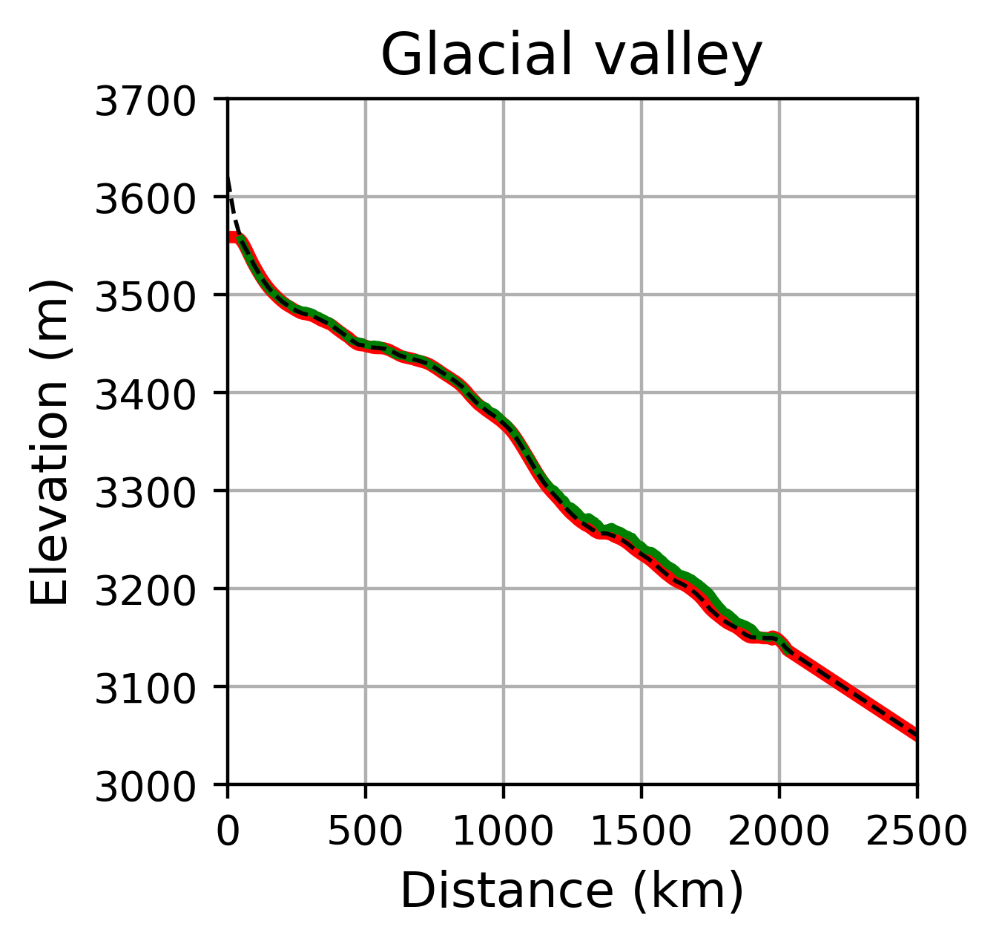

In [281]:
# Visualize initial topography

fig2 = plt.figure()
#ax = plt.axes()
plt.rcParams["figure.figsize"] = (7,3) # (w, h)

#pylab.plot(x,z0,'c',linewidth=0.5)
#pylab.plot(x,zb0,'r',linewidth=0.5)

pylab.plot(x_sopris*1000,zb_sopris,'r',linewidth=3)
pylab.plot(x_sopris_old*1000,zb_sopris_old,'g',linewidth=2)
pylab.plot(x,zb_new,'k--',linewidth=1)

pylab.xlim(0,xmax)
pylab.ylim(3000,3700)
pylab.grid()
pylab.xlabel('Distance (km)',fontsize=12)
pylab.ylabel('Elevation (m)',fontsize=12)
pylab.title("Glacial valley",fontsize = 14)
pylab.show()

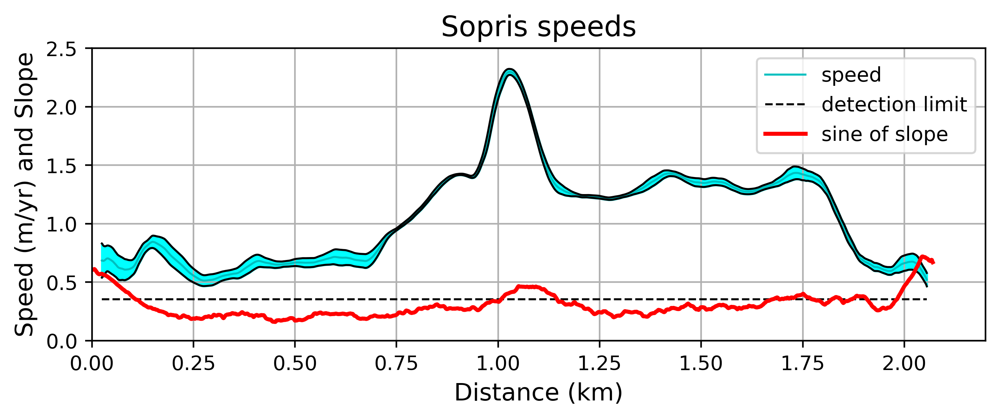

In [283]:
# Read in measured speeds of the Sopris rock glacier so that we may compare
# our modeled speeds with these measurments

# detection limit is 0.354 m/yr

df = pd.read_excel(r'sopris_speeds.xlsx')
x_sopris_speeds = df['x_sopris']
Us_sopris_speeds = df['us_sopris']
Us_sopris_speed_errs = df['us_std_sopris']

df2 = pd.read_excel(r'sopris_slopes100msmoothed.xlsx')
x_slopes = df2['x_slope']
sopris_slopes = df2['slope100m']
sopris_slopes = numpy.sin(sopris_slopes*numpy.pi/180)

fig2 = plt.figure()
#ax = plt.axes()
plt.rcParams["figure.figsize"] = (7,3) # (w, h)

pylab.plot(x_sopris_speeds,Us_sopris_speeds,'c',linewidth=1,label='speed')
pylab.plot(x_sopris_speeds,Us_sopris_speeds-Us_sopris_speed_errs,'k',linewidth=1)
pylab.plot(x_sopris_speeds,Us_sopris_speeds+Us_sopris_speed_errs,'k',linewidth=1)

plt.fill_between(x_sopris_speeds, Us_sopris_speeds-Us_sopris_speed_errs, Us_sopris_speeds+Us_sopris_speed_errs, color='cyan', alpha=1)

pylab.plot(x_sopris_speeds,0.354*numpy.ones(len(x_sopris_speeds)),'k--',linewidth=1,label='detection limit')
pylab.plot(x_slopes/1000,sopris_slopes,'r',linewidth=2,label="sine of slope")


pylab.legend()

#pylab.xlim(0,xmax)
pylab.ylim(0,2.5)
pylab.xlim(0,2.2)

pylab.grid()
pylab.xlabel('Distance (km)',fontsize=12)
pylab.ylabel('Speed (m/yr) and Slope',fontsize=12)
pylab.title("Sopris speeds",fontsize = 14)


plt.tight_layout()

plt.savefig("sopris speed profile data.pdf")

pylab.show()


## Now we need to impose a climate forcing

- the easiest method is to assign a pattern of net balance, b(z)
- next we would wish to define both winter and summer balances and add them to get the net balance

<Figure size 2800x1200 with 0 Axes>

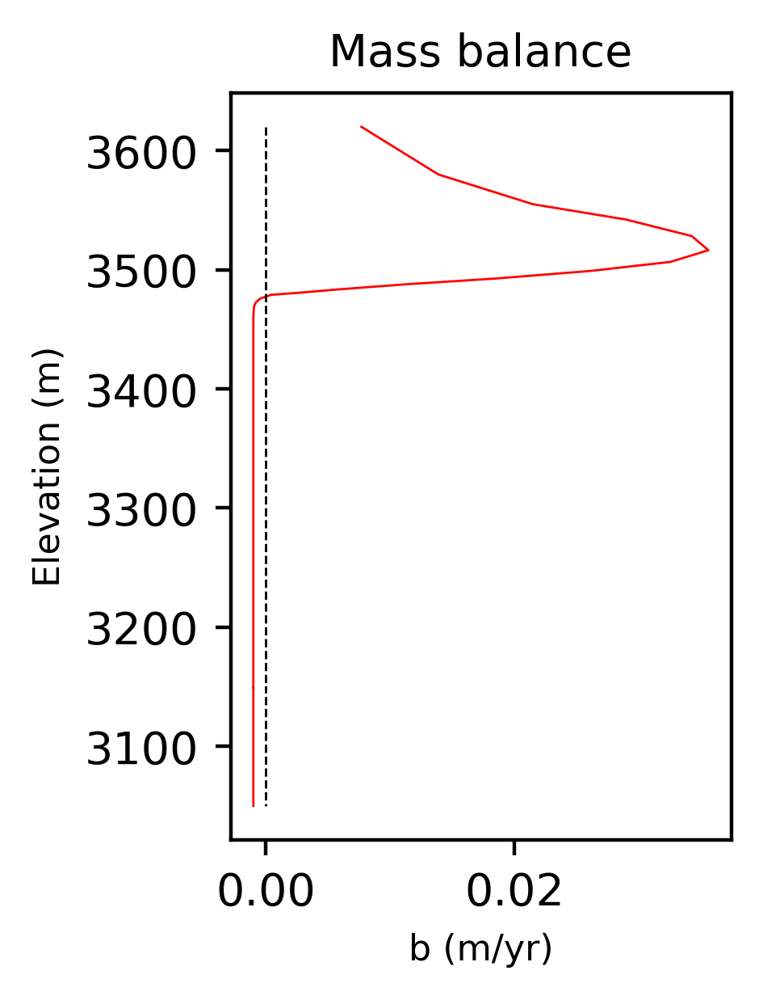

(3.7812658718027947, 6.5)

In [284]:
# Climate forcing

#z_ela = 3050.0 # equilibrium line elevation, ELA
zela_bar = 3200
zela_amp = 400
#ela_period = 500

#z_ela = zela_bar - (zela_amp * numpy.sin(2*numpy.pi*t/ela_period)) # note it drops from mean first due to - sign
z_ela = numpy.zeros(t.size)

toggle_climate = 3

if toggle_climate ==1:
    D00 = 10 # steady state discharge to which this mass balance model corresponds
    Dshift = 2
    Damp = (D00+Dshift)/2
    D0 = (Damp-Dshift) + Damp * numpy.cos(2*numpy.pi*t/ela_period)  
    D0 = numpy.maximum(D0,0)
    
elif toggle_climate ==2:
# or a try at Holocene compilation
#tH = numpy.arange(0,12000,50)

    L1 = 1-(1/12000)*t
    L2 = 2-(2 * (1-numpy.exp(-(t/1800))))
    tmid = 5500
    L3 = 0.15 * numpy.exp(-((t-tmid)/1200)**2)
    L4 = 0.1 * numpy.exp(-((t-10800)/250)**2)
    L = L1-L2+L3+L4
    #D0 = 10 - (23*L)
    D0 = 10 - (23*L)
    
    D0 = numpy.minimum(D0,9) 
    D0 = numpy.maximum(D0,0)    

else: # just three simple steps
    t1 = 0
    #t2 = tmax-7000
    #t3 = tmax-4500
    t2 = tmax-8000
    #t3 = tmax-1500
    #t3 = tmax-3200 # in nov23 models
    #t4 = tmax-2700 # in nov23 models
    t3 = tmax-4000 
    t4 = tmax-2600
    #t4 = tmax-3000
    
    # beginning and end of LIA:
    #t5 = tmax-830 # in nov23 models
    #t6 = tmax-110 # in nov23 models
    #t5 = tmax-970 # in june models
    #t6 = tmax-180
    t5 = tmax-1020
    t6 = tmax-100
    
    # in mockup code
    #Dphase1 = 4.5 # early Holocene
    #Dphase2 = 0 # mid Holocene hypsithermal
    #Dphase3 = 5.2 # late Holocene or Neoglacial
    
    #Dphase1 = 5.7 # early Holocene (was 6.0)
    #Dphase2 = 0.0 # mid Holocene hypsithermal
    #Dphase3 = 5.9 # late Holocene or Neoglacial (was 5.8 in 1mm melt case)

    Dphase1 = 6.5 # early Holocene (was 6.0, 7.5 in nov23)
    Dphase2 = 0.0 # mid Holocene hypsithermal
    Dphase3 = 12.0 # late Holocene or Neoglacial (was 5.8 in 1mm melt case)
    #Dphase4 = 4 # works ok June3 but too fast
    Dphase4 = 2.0 # works for July 23 runs
    
    #Dphase5 = 36 # LIA used in Nov23 model
    #Dphase5 = 28 # was 36 28 in june
    Dphase5 = 28 # for july 23 runs
    Dphase6 = 18

    D0 = Dphase2*numpy.ones(len(t))
    D0[t<t2]=Dphase1
    D0[t>t3]=Dphase3
    D0[t>t4]=Dphase4
    D0[t>t5]=Dphase5
    D0[t>t6]=Dphase6
    
    #sigma_D0=1.0 # adds randomness fto the imposed climate (0 if we wish no noise)
    sigma_D0=0
    D0 = D0 + numpy.random.normal(loc=0.0, scale=sigma_D0, size=len(t))
    D0 = numpy.maximum(D0,0)
            

# Now for the spatial (in x) pattern of b
# in the usgs 3dep image avalanche zone is 270 - 570 m
# used in old model
#x0=420
#sigmabx = 100
#B0 = D0[0]/(numpy.sqrt(numpy.pi)*sigmabx)

# used in sopris more precise model
x0=120
sigmabx = 100
B0 = D0[0]/(numpy.sqrt(numpy.pi)*sigmabx) # a constant to assure the proper integral of a gaussian distribution

# allows a tiny bit of melt to the column beneath debris
# beyond the accumulation/avalanche zone
b_debris = -0.001 # in Oct-Nov23 models  
b_debris = -0.001 

# new simple mass balance profile for rock glacier case...just in the avalanche zone
b = b_debris + B0*numpy.exp(-((x-x0)/sigmabx)**2) 

# where the rocks get deposited, distance from the headwall and distributed uniformly
#max_rockfall = 500
#min_rockfall = 100

# was 300-550 in early Sept 2023 runs
#max_rockfall = 550
#min_rockfall = 350

max_rockfall = 250
min_rockfall = 20

fig3 = plt.figure()
fig3 = plt.figure(figsize=(2,3))
ax = plt.axes()
#plt.rcParams["figure.figsize"] = (4,3) # (w, h)

pylab.plot(b,z,'r',linewidth=0.5)
pylab.plot(numpy.zeros(z.size),z,'k--',linewidth=0.5)
#pylab.xlim(0,xmax)
#pylab.ylim(numpy.min(zb0)-1,numpy.max(z0)+2)

pylab.xlabel('b (m/yr)',fontsize=8)
pylab.ylabel('Elevation (m)',fontsize=8)
pylab.title("Mass balance",fontsize = 10)
pylab.show()

Q0 = numpy.sum(b*dx) # calculating the effective ss discharge to be expected from this imposed mass balance
Q0, D0[0]

<Figure size 2800x1200 with 0 Axes>

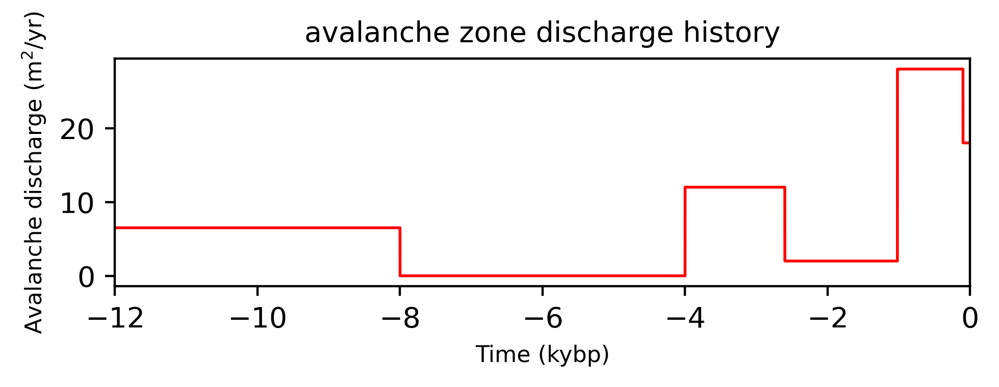

In [285]:
# Plot th climate forcing and save the figure

fig4 = plt.figure()
fig4 = plt.figure(figsize=(5,2))
ax = plt.axes()
#plt.rcParams["figure.figsize"] = (4,3) # (w, h)

pylab.plot(-(tmax-t)/1000,D0, 'r',linewidth=1)
#pylab.plot(t/1000,D0, 'r',linewidth=1)

#pylab.plot(t,x_ELA/1000, 'k--',linewidth=1)
#ttext = str(numpy.int_(t[i]) + ' years')
#pylab.text(3000,15,ttext,fontsize=14)
pylab.xlabel('Time (kybp)',fontsize=8)
pylab.ylabel('Avalanche discharge (m$^2$/yr)',fontsize=8)
pylab.title("avalanche zone discharge history",fontsize = 10)
pylab.xlim(-tmax/1000,0)

plt.tight_layout()
plt.savefig("sopris model climate forcing history.pdf")

pylab.show()

In [287]:
# initialize a figure to which we add snapshots every time t = a multiple of tplot
#fig4 = plt.figure()
#ax = plt.axes()
#plt.rcParams["figure.figsize"] = [6,3] # (w, h)

# initialize an array of zeros for comparison with the H array within the loop
Hnot = numpy.zeros((x.size,),float)
nframe = 0
zlast = z # for plotting purposes

xterm = numpy.zeros(t.size)
x_ELA = numpy.zeros(t.size)

Ages = []
xAges = []
edot_xx_tracers = []
exx_tracers = []
h_tracers = []

xrockfall = numpy.zeros(nplots)
Ages1 = numpy.zeros(nplots)
xAges1 = numpy.zeros(nplots)

Ages50 = numpy.zeros(nplots-50)
xAges50 = numpy.zeros(nplots-50)

Ages100 = numpy.zeros(nplots-100)
xAges100 = numpy.zeros(nplots-100)

Ages150 = numpy.zeros(nplots-150)
xAges150 = numpy.zeros(nplots-150)


In [288]:
# Here is the big time loop!

# set up the movie
#fig, ax = plt.subplots(1,1,figsize=(7,4)) # open a blank figure

fig,(ax1, ax2) = plt.subplots(2, 1, gridspec_kw={'height_ratios':[3, 1]},figsize=(7,5))

Us_plot = numpy.zeros((len(x_edge),nplots))
H_profile = numpy.zeros((len(x),nplots))

# frame counters
nframe = -1
nframe2 = -1

with writer.saving(fig, "RG_soliton_Sopris_July23_2024_rand_1_E3_b1mm_D1p0_0pct.mp4", dpi_movie):

    for i in range(1,imax):
        
        # update the local mass balance
        #b = dbdz*(z-z_ela[i])
        #bmax = bcap*numpy.ones(b.size)
        #b = numpy.minimum(bmax,b)
        
        #sigmabx = 200

        B0 = D0[i]/(numpy.sqrt(numpy.pi)*sigmabx)
        #x0 = 400

# new simple mass balance profile for rock glacier case...just in the avalanche zone
        b = b_debris + B0*numpy.exp(-((x-x0)/sigmabx)**2) 
        
        accumulation = numpy.where(b>0)
        arraySize = numpy.size(accumulation)
        if arraySize==0:
            z_ela[i]=zbmax
        else:
            z_ela[i]= z[accumulation[-1][0]] # take the last positive mass balance to be the ela
        
        # calculate the analytic solution for the steady state ice discharge
        Qanalytic = numpy.cumsum(b)*dx
        Qanalytic[Qanalytic<0]=0

        # we are using a staggered grid so have to calculate the H at the edges of cells
        Hedge = 0.5 * (H[0:-1] + H[1:])

        # or uniform thickness of rocky carapace
        h_rock = h_rock0 * numpy.ones(len(Hedge))
        
        # local slopes
        S = numpy.diff(z)/dx
        # note that Hedge and S will have the same length
        
        if toggle_rock == 0: 
            taub = rho_i*g*Hedge*S
            # mean ice speed (ignoring sliding)
            Ubar = (2.0*A/(n+2.0))*((numpy.abs(taub))**n)*Hedge
            U_surface = (5/4) * Ubar
        
            # ice discharge including zero flux boundary conditions at the edges
            Q = numpy.zeros(((Hedge.size+2),),float)
            Q[1:-1] = Ubar*Hedge # at the interior edges of the calculation space
            Q[0]=0
            Q[-1]=0

        elif toggle_rock == 1: # crudely takes into account the added stress of the rocky cover
            taub = rho_i*g*Hedge*S
            Sb = numpy.diff(zb)/dx
            taub_rock = numpy.zeros(len(Hedge))

            taub_rock[Hedge>0] = rho_rock*C_rock*g*h_rock[Hedge>0]*Sb[Hedge>0]
            taub = taub + taub_rock
        
            # mean ice speed (ignoring sliding)
            Ubar = (2.0*A/(n+2.0))*((numpy.abs(taub))**n)*Hedge
            U_surface = (5/4) * Ubar
        
            # ice discharge including zero flux boundary conditions at the edges
            Q = numpy.zeros(((Hedge.size+2),),float)
            Q[1:-1] = Ubar*Hedge # at the interior edges of the calculation space
            Q[0]=0
            Q[-1]=0

        # so that it is in one place,here is the analytic solution for U(z) and Q including a rocky carapace
        # from glacier speed profile code 09/14/2023
        #Hice = H - h_rock
        #B = ((c_r * rho_rock) + ((rho_ice*(1-c_r)))) * (g * h_rock * S)
        #term1 = ((B**3) * z)
        #term2 = 3 * (B**2) * (rho_ice*g*S)*((Hice*z)-0.5*(z**2))
        #term3 = 3 * B * ((rho_ice*g*S)**2) * ((Hice*Hice*z) - (Hice*z*z) + (z**3)/3)
        #term4 = ((rho_ice*g*S)**3) * ((Hice*Hice*Hice*z) - (1.5*Hice*Hice*z*z) + (Hice*z*z*z) - ((z**4)/4))

        #U_rocky_analytic = 2 * Aice * (term1+term2+term3+term4)
        #Q_rocky_analytic = dz*numpy.sum(U_rocky_analytic)
        
        else: # this handles the more real case of stress assocaigted wiht boht the capping carapace and
            # rock within the icy core
            rho_cap = (C_rock * rho_rock) + (rho_i*(1-C_rock))
            B = rho_cap * g * h_rock * numpy.abs(S)
            rho_core = (C_rock_core * rho_rock) + (rho_i*(1-C_rock_core))
            #C = rho_i * g * numpy.abs(S)
            C = rho_core * g * numpy.abs(S) # replaced pure ice case with this June 3 2024
            
            TERM1 = 0.5*(B**3) * (Hedge**2)
            TERM2 = (B**2) * C * (Hedge**3)
            TERM3 = 0.25 * B * (C**2) * (Hedge**4)
            TERM4 = 0.2 * (C**3) * (Hedge**5)
            Q = numpy.zeros(((Hedge.size+2),),float)
            Q[1:-1] = 2 * A * (TERM1+TERM2+TERM3+TERM4)
            Ubar = Q[1:-1]/Hedge
            U_surface = (5/4)*Ubar
            Q[0]=0
            Q[-1]=0
                
        # conserve ice
        dQdx = numpy.diff(Q)/dx

        # and update the ice thickness
        dHdt = b - dQdx
        H = H + (dHdt*dt)

        # prevent negative ice thicknesses
        H = numpy.maximum(H,Hnot)

        # update ice topography
        z = zb + H
        
        # find instantaneous positions of the terminus
        xterm[i]=x[H==0][0]
        
        # plotting, aging, straining and tracking of rocks
        if (t[i]%tplot)==0: # plot only when the remainder of t(i)/tplot is zero
            #f,(ax1, ax2) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]})
            
            nframe = nframe+1
            hmax = max(H)
            
            # drop on rocks and add to ages
            ageadd =  numpy.array([0])
            Ages = numpy.concatenate((ageadd, Ages), axis=None)
            Ages = Ages + tplot
            Ages1[nframe] = Ages[-1]

            #save the u(x) in a file for plotting
            Us_plot[:,nframe] = U_surface
            H_profile[:,nframe] = H
                        
            # uniform distribution
            xrockfall[nframe] = numpy.random.uniform(min_rockfall,max_rockfall, 1)
    
            # gaussian distribution
            normal_mean = 0.5*(min_rockfall+max_rockfall)
            #xrockfall[nframe] = numpy.random.normal(normal_mean, 40,1)
            
            # exponential  distribution
            # xrockfall[nframe] = min_rockfall + 50 + numpy.random.exponential(30,1)
            
            xageadd =  numpy.array(xrockfall[nframe]) # mean position of a rock starting point   
            xAges = numpy.concatenate((xageadd, xAges), axis=None)
            
            # now need to interpolate to find x indeces and hence U_surface indeces
            Us_tracers = numpy.interp(xAges,x_edge,U_surface)
            xAges = xAges + (tplot*Us_tracers)
            
            # now assess the local strain rate around each tracer
            #edot_xx = numpy.interp(xAges,x_edge,U_surface)
            exxadd =  0 # original strain = 0   
            exx_tracers = numpy.concatenate((exxadd, exx_tracers), axis=None)
            h_tracers = numpy.concatenate((h0, h_tracers), axis=None)
           
            edot_xx =  numpy.diff(U_surface)/dx  # horizontal strain rate
            edot_xx_tracers = numpy.interp(xAges,x[1:-1],edot_xx) # tho this should really be interpolated onto x and not xedge
            
            dh = h_tracers * (-edot_xx_tracers*tplot) # the minus sign means extensional strain in xx results in thickening in z
            h_tracers = h_tracers + dh
            
            #exx_tracers = exx_tracers+(-edot_xx_tracers*tplot) # accumulated strain
            
            xAges1[nframe] = xAges[-1]
            
            if nframe>50:
                xAges50[nframe-50] = xAges[-49]
                Ages50[nframe-50] = Ages[-49]

            if nframe>100:
                xAges100[nframe-100] = xAges[-99]
                Ages100[nframe-100] = Ages[-99]

            if nframe>150:
                xAges150[nframe-150] = xAges[-149]
                Ages150[nframe-150] = Ages[-149]
                
            zlast = z
            
            xglacier = x[H>0]
            zglacier = z[H>0]

            glacier_indeces = numpy.where(H>0)
            glacier_mid_index = numpy.int_(numpy.max(glacier_indeces)/2)

            zminplot = min(zb)-50
            zmaxplot = max(zb)+100

            x2 = numpy.flip(x,0)
            xfill = numpy.concatenate((x,x2),axis=0)
            z2= numpy.flip(z,0)
            zfill = numpy.concatenate((zb,z2),axis=0)

                        #pylab.fill(xfill/1000,zfill,'deepskyblue') 
                        #plt.fill_between(x/1000, zminplot, zb, color='peru', alpha=1)

                        #pylab.xlim(0,xmax/1000)
                        #pylab.ylim(min(zb)-50,max(zb)+100)
                        #pylab.xlabel('Distance (m)',fontsize=12)
                        #pylab.ylabel('Elevation (m)',fontsize=12)
                        #pylab.title("1D Glacier",fontsize = 14)
                        #pylab.show()


            #f,(ax1, ax2) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]})

            #plt.title('Final profiles')

            #plt.subplot(2, 1, 2)
            plt.subplot2grid((4, 7), (3, 0), colspan=7)
            #ax2 = plt.subplot(212)
            plt.plot(x/1000,H,'k',linewidth=1)
            plt.fill_between(x/1000, 0, H, color='deepskyblue', alpha=1)
            #ax2.set_ylabel('Ice (m)',fontsize=12)
            plt.ylabel('Ice (m)',fontsize=12)

            plt.xlabel('Distance (km)',fontsize=12)
            plt.xticks(fontsize=8)
            #ax1 = plt.subplot(211, sharex=ax2)
            #ax1.tick_params('x/1000', labelbottom=False)
            plt.ylim([0, 50])
            pylab.xlim([0,xmax/1000])

            plt.yticks(fontsize=8)
            plt.xticks(fontsize=8)
            
            #pylab.plot(x/1000,zb, 'k',linewidth=1)
            #pylab.plot(x/1000,z, 'g',linewidth=0.5)
            
            #plt.subplot(2, 1, 1)
            plt.subplot2grid((4, 7), (0, 0), rowspan=3, colspan=7)
            plt.plot(x/1000,zb, 'k',linewidth=1)
            plt.plot(x/1000,z, 'g',linewidth=0.5)
            plt.ylabel('Elevation (m)',fontsize=12)
            #plt.yticks(fontsize=8)
            #ax1.set_yticklabels(z,fontsize=8)
            
            #plt.setp(ax1.get_yticklabels(), fontsize=8)
            plt.fill_between(x/1000, zminplot, zb, color='peru', alpha=1)
            plt.fill(xfill/1000,zfill,'deepskyblue') 
            #plt.ylim([zminplot,zmaxplot])
            #pylab.ylim(min(zb)-50,max(zb)+150)
            plt.ylim(min(zb)-50,max(zb)+50)

            # add a time clock text stamp
            #ttext2 = str(numpy.int_(tmax-t[i]))
            ttext2 = str(numpy.int_(tmax-t[i])) + ' years bp'
            #plt.text(0.7*xmax/1000,max(zb)-200,'years bp',fontsize=12)
            plt.text(0.6*xmax/1000,max(zb)-100,ttext2,fontsize=12)

            ax1.margins(0) 
            
            ax1.xaxis.set_tick_params(labelbottom=False)
            ax1.set_xticks([])
            ax1.set_ylim([zminplot,zmaxplot])
            
            #plt.xaxis.set_tick_params(labelbottom=False)
            #plt.set_xticks([])
            #ax1.set_ylim([zminplot,zmaxplot])
            #ax1.tick_params('x/1000', labelbottom=False)

            plt.yticks(fontsize=8)
            #plt.xticks(fontsize=8)
            plt.xticks([])
            pylab.xlim([0,xmax/1000])
            #pylab.ylim(min(zb)-50,max(zb)+100)

            plt.title('Holocene Evolution of Rock Glacier')
            plt.tight_layout()

            #f.tight_layout()
            
            writer.grab_frame()

            
            
            
            if (nframe%10)==0:
                print("nframe = ",nframe)
                print("max H = ",hmax)
            

        plt.clf()
#            

#        if (t[i]%(2*tplot))==0: # plot only when the remainder of t(i)/tplot is zero
#            nframe2 = nframe2+1
            #print("nframe2 = ",nframe2)
#            pylab.plot(x_edge/1000,U_surface, 'b',linewidth=0.5,alpha = numpy.exp(-t[i]/tmax))
            
pylab.show()

/var/folders/75/pqg12pf122bdc1f2fw143bhw0000gn/T/ipykernel_81516/3030312643.py:116: RuntimeWarning: invalid value encountered in divide
  Ubar = Q[1:-1]/Hedge


nframe =  0
max H =  2.140016262021038
nframe =  10
max H =  20.718986573786367
nframe =  20
max H =  27.54890518857282
nframe =  30
max H =  29.581198821139793
nframe =  40
max H =  31.150140922672023
nframe =  50
max H =  34.728140571984625
nframe =  60
max H =  36.6945387859921
nframe =  70
max H =  36.37690360119129
nframe =  80
max H =  32.49130780079405
nframe =  90
max H =  29.67130849052058
nframe =  100
max H =  27.565392641631686
nframe =  110
max H =  25.879170115126684
nframe =  120
max H =  24.45966183062757
nframe =  130
max H =  23.221397824288413
nframe =  140
max H =  29.806525098630477
nframe =  150
max H =  38.43710102399044
nframe =  160
max H =  39.4971664061602
nframe =  170
max H =  34.86361760120395
nframe =  180
max H =  32.45704676479924
nframe =  190
max H =  46.790251019166604


<Figure size 2800x2000 with 0 Axes>

In [289]:
nframe


199

In [290]:
numpy.mean(H),max(H)


(22.790920297629647, 48.08891569575069)

<Figure size 2000x1200 with 0 Axes>

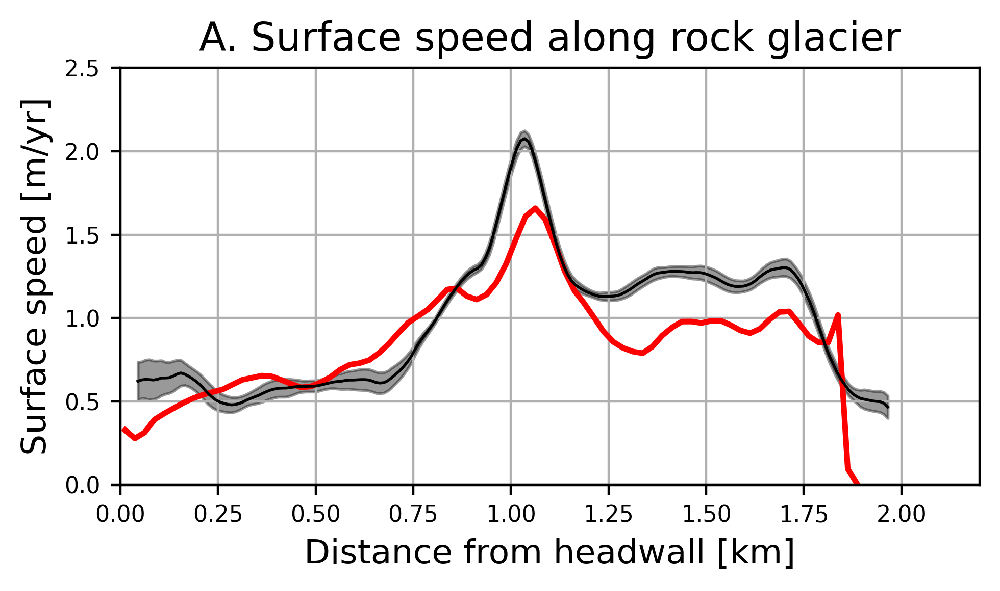

In [348]:
# plot speed profile and compare it with measured speed profile
fig5 = plt.figure()
fig5 = plt.figure(figsize=(5,3))
ax = plt.axes()

df1 = pd.read_excel(r'output_relief_velocity_slope_thickness_bedrock_june3_2024.xlsx')

x_2015_2019 = df1['Horizontal_distance_[km]']
v_2015_2019 = df1['Surface velocity [m/yr]']
ev_2015_2019 = df1['1stdev [m/yr]']
CA0_2015_2019 = 0.354645044


edot_xx =  numpy.diff(U_surface)/dx  # horizontal strain rate

pylab.plot(x_edge/1000,U_surface, 'r',linewidth=2)

box_pts = 3
box = numpy.ones(box_pts)/box_pts
Us_smooth = numpy.convolve(U_surface, box, mode='same')

#pylab.plot(x_edge,Us_smooth, 'c',linewidth=2)


#pylab.plot(x_sopris_speeds*1000,Us_sopris_speeds,'r',linewidth=1)
#.plot(x_sopris_speeds*1000,Us_sopris_speeds-Us_sopris_speed_errs,'k',linewidth=1)
#pylab.plot(x_sopris_speeds*1000,Us_sopris_speeds+Us_sopris_speed_errs,'k',linewidth=1)
#plt.fill_between(x_sopris_speeds*1000, Us_sopris_speeds-Us_sopris_speed_errs, Us_sopris_speeds+Us_sopris_speed_errs, color='red', alpha=0.4)

pylab.plot(x_2015_2019,v_2015_2019,'k',linewidth=1)
#pylab.plot(x_2015_2019*1000,v_2015_2019-ev_2015_2019,'k',linewidth=1)
#pylab.plot(x_2015_2019*1000,v_2015_2019+ev_2015_2019,'k',linewidth=1)
#plt.fill_between(v_2015_2019, v_2015_2019-ev_2015_2019, v_2015_2019+ev_2015_2019, color='red', alpha=0.4)
plt.fill_between(x_2015_2019, v_2015_2019-ev_2015_2019, v_2015_2019+ev_2015_2019, color='black', alpha=0.4)


#pylab.plot(xAges/1000,Us_tracers,'ro')
pylab.ylim(0,2.5)
pylab.xlim(0,2.2)
pylab.xlabel('Distance from headwall [km]',fontsize=12)
pylab.ylabel('Surface speed [m/yr]',fontsize=12)
pylab.title("A. Surface speed along rock glacier",fontsize = 14)
pylab.grid()

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.tight_layout()

plt.savefig("speed data and final model profile_july23.pdf")

pylab.show()

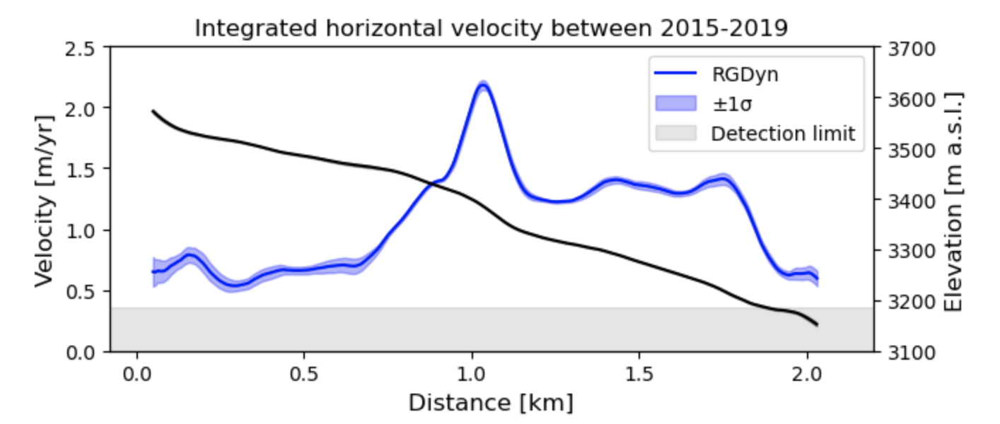

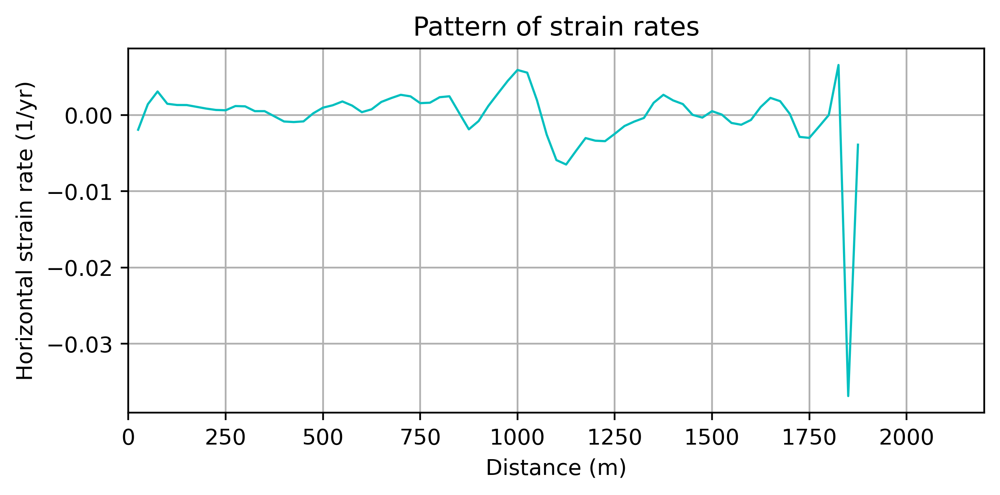

In [292]:
#pylab.plot(x_edge[1:],edot_xx, 'c',linewidth=1)
pylab.plot(x[1:-1],edot_xx, 'c',linewidth=1)
#pylab.ylim(0,1.1*max(U_surface))
pylab.xlim(0,2200)
pylab.xlabel('Distance (m)',fontsize=10)
pylab.ylabel('Horizontal strain rate (1/yr)',fontsize=10)
pylab.title("Pattern of strain rates",fontsize = 12)
pylab.grid()
pylab.show()

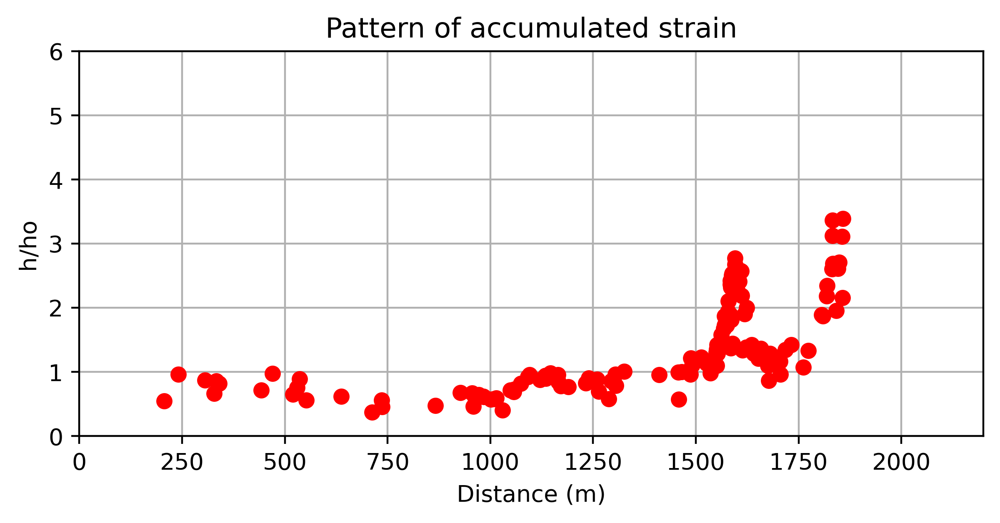

In [293]:
# strain plot

pylab.plot(xAges,h_tracers/h0, 'ro',linewidth=1)
pylab.xlim(0,2200)
pylab.ylim(0,6)
pylab.xlabel('Distance (m)',fontsize=10)
pylab.ylabel('h/ho',fontsize=10)
pylab.title("Pattern of accumulated strain",fontsize = 12)
pylab.grid()
pylab.show()


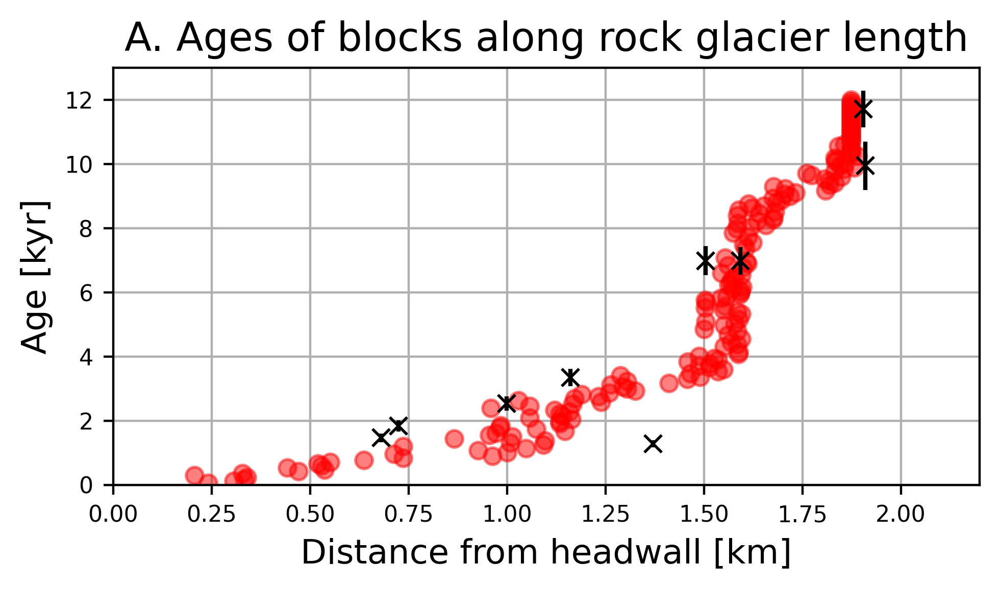

In [349]:
# 10Be data from Sopris and comparison with modeled ages of surface rocks

fig7 = plt.figure()
ax = plt.axes()
plt.rcParams["figure.figsize"] = [5,3] # (w, h)

# sopris data
xAges_sopris = [680, 724, 999, 1161, 1371, 1504, 1592, 1905, 1910]
xAges_sopris = numpy.array([680, 724, 999, 1161, 1371, 1504, 1592, 1905, 1910])

Ages_sopris = [1.47,1.84, 2.54, 3.35, 1.29, 6.99, 6.98, 11.72, 9.95]
Ages_sopris_meanP = [1.61,1.93, 2.59, 3.32, 1.30, 7.08, 7.06, 11.77, 9.82] #output from cosmo sopris interpretation file 7/23/24
Ages_error_sopris = [0.13, 0.17, 0.22, 0.27, 0.11, 0.45, 0.43, 0.57, 0.76]

pylab.plot(xAges/1000,Ages/1000, 'ro',linewidth=0.25,alpha = 0.5)
# following lines allow visualizing age trajectories
#pylab.plot(xAges1,Ages1/1000,'g',alpha = 0.8)
#pylab.plot(xAges50,Ages50/1000,'g',alpha = 0.6)
#pylab.plot(xAges100,Ages100/1000,'g',alpha = 0.4)
#pylab.plot(xAges150,Ages150/1000,'g',alpha = 0.2)
#pylab.plot(xAges_sopris/1000,Ages_sopris_meanP, 'kx',linewidth=1)
plt.errorbar(xAges_sopris/1000, Ages_sopris, yerr=Ages_error_sopris, fmt='x',color='k')

pylab.xlabel('Distance from headwall [km]',fontsize=12)
pylab.ylabel('Age [kyr]',fontsize=12)
pylab.title("A. Ages of blocks along rock glacier length",fontsize = 14)
pylab.xlim(0,2.2)
pylab.ylim(0,13)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.grid()
#pylab.show()

plt.tight_layout()

plt.savefig("age profile_meanP_july23.pdf")

pylab.show()

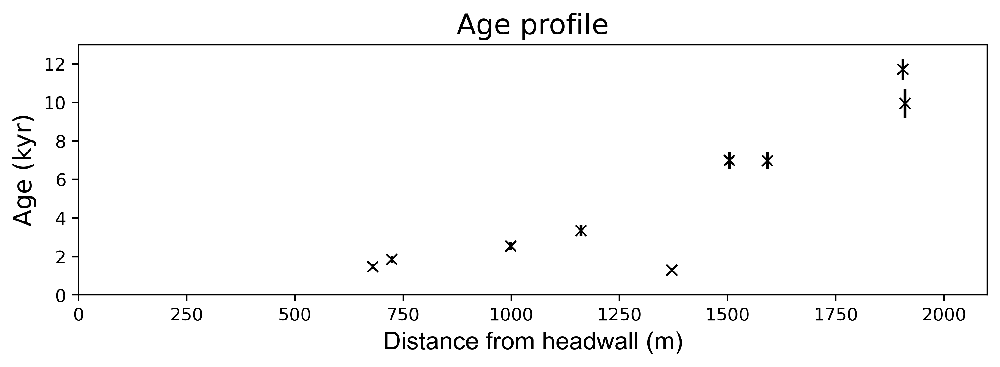

In [295]:
#pylab.plot(xAges_sopris,Ages_sopris, 'rx',linewidth=1)
#pylab.plot(xAges_sopris, Ages_error_sopris)
plt.errorbar(xAges_sopris, Ages_sopris, yerr=Ages_error_sopris, fmt='x',color='k')

pylab.xlabel('Distance from headwall (m)',font='arial',fontsize=14)
pylab.ylabel('Age (kyr)',fontsize=14)
pylab.title("Age profile",fontsize = 16)
pylab.xlim(0,2100)
pylab.ylim(0,13)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()

plt.savefig("sopris age data profile_july23.pdf")


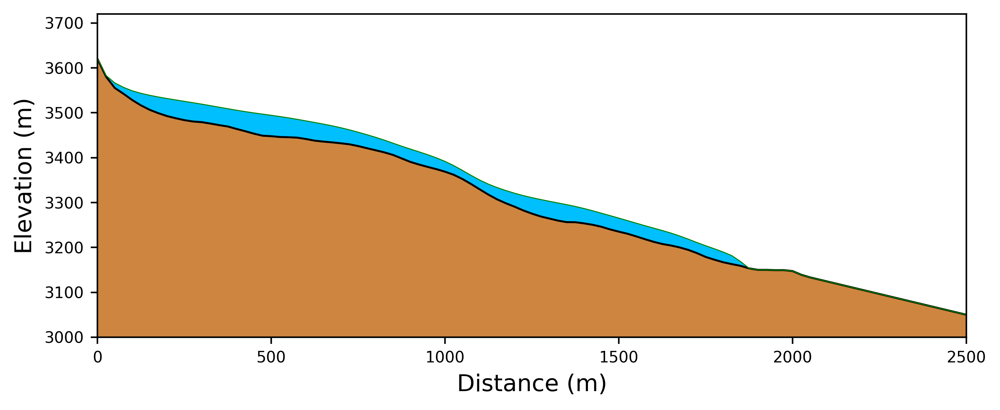

In [296]:
# plotting
fig5 = plt.figure()
ax = plt.axes()
xframe = 7
zframe = 3
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)

pylab.plot(x,zb, 'k',linewidth=1)
pylab.plot(x,z, 'g',linewidth=0.5)
#pylab.plot(x,zb0, 'r',linewidth=0.5)
#pylab.plot(x,z0, 'c',linewidth=0.5)

# add an arrow
xglacier = x[H>0]
zglacier = z[H>0]
            
glacier_indeces = numpy.where(H>0)
glacier_mid_index = numpy.int_(numpy.max(glacier_indeces)/2)

#arrow_indeces = [30,60,90]
#            xhead = x[glacier_mid_index]
#            zhead = z[glacier_mid_index]+10
#xhead = x[arrow_indeces]
#zhead = z[arrow_indeces]+10

xfrac = 0.1
Uscale = 50
            #dx_arrow = xfrac*xmax * (U_surface[glacier_mid_index]/Uscale)
            #Smid = S[glacier_mid_index]
#dx_arrow = xfrac*xmax * (U_surface[arrow_indeces]/Uscale)
#Smid = S[arrow_indeces]

zminplot = min(zb)-50
zmaxplot = max(zb)+100
#dz_arrow = dx_arrow*Smid

#pylab.arrow(xhead/1000,zhead,dx_arrow/1000,dz_arrow,head_width=0.2, head_length=1,width = 0.05,fc='r', ec='r')
#pylab.arrow(xhead[1]/1000,zhead[1],dx_arrow[1]/1000,dz_arrow[1],width=0.03,head_width=0.3,head_length = 20,fc='deeppink', ec='deeppink')
            
x2 = numpy.flip(x,0)
xfill = numpy.concatenate((x,x2),axis=0)
z2= numpy.flip(z,0)
zfill = numpy.concatenate((zb,z2),axis=0)

pylab.fill(xfill,zfill,'deepskyblue') 
plt.fill_between(x, zminplot, zb, color='peru', alpha=1)

pylab.xlim(0,xmax)
pylab.ylim(min(zb)-50,max(zb)+100)
pylab.xlabel('Distance (m)',fontsize=12)
pylab.ylabel('Elevation (m)',fontsize=12)
#pylab.title("1D Glacier",fontsize = 14)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
pylab.show()

In [297]:
print(numpy.mean(H))

22.790920297629647


<Figure size 2800x1200 with 0 Axes>

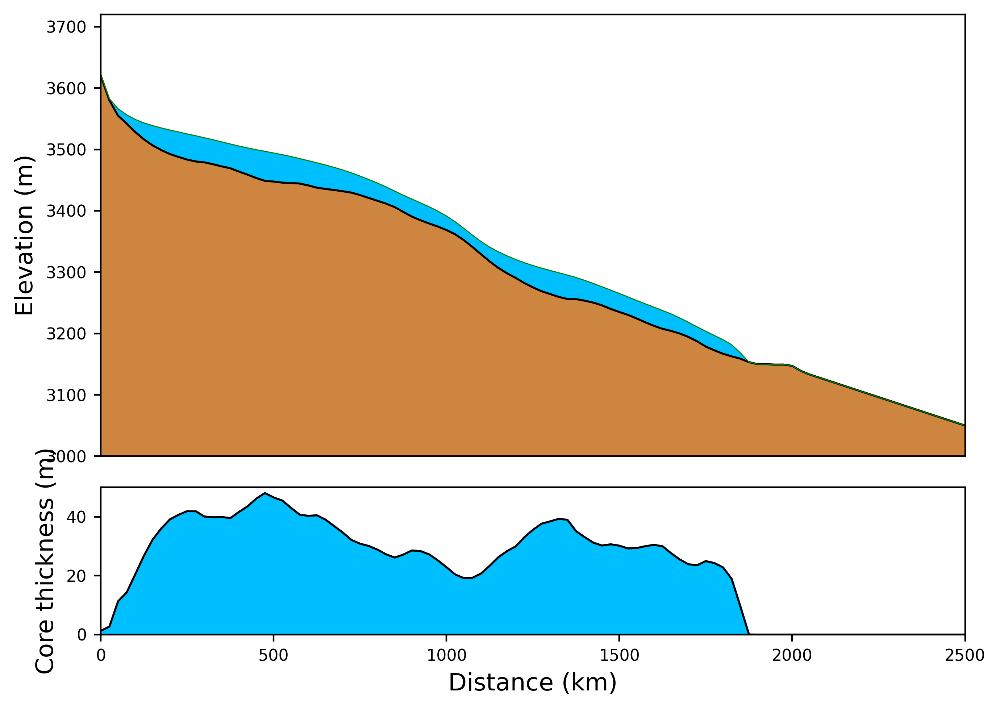

In [298]:
# now make a two-part figure to emphasize the ice thickness pattern

# plotting
fig5 = plt.figure()
#ax = plt.axes()
xframe = 7
zframe = 5
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)
            
xglacier = x[H>0]
zglacier = z[H>0]

glacier_indeces = numpy.where(H>0)
glacier_mid_index = numpy.int_(numpy.max(glacier_indeces)/2)

zminplot = min(zb)-50
zmaxplot = max(zb)+100

x2 = numpy.flip(x,0)
xfill = numpy.concatenate((x,x2),axis=0)
z2= numpy.flip(z,0)
zfill = numpy.concatenate((zb,z2),axis=0)

            #pylab.fill(xfill/1000,zfill,'deepskyblue') 
            #plt.fill_between(x/1000, zminplot, zb, color='peru', alpha=1)

            #pylab.xlim(0,xmax/1000)
            #pylab.ylim(min(zb)-50,max(zb)+100)
            #pylab.xlabel('Distance (m)',fontsize=12)
            #pylab.ylabel('Elevation (m)',fontsize=12)
            #pylab.title("1D Glacier",fontsize = 14)
            #pylab.show()


f,(ax1, ax2) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]})

#plt.title('Final profiles')

#plt.subplot(2, 1, 2)
#ax2 = plt.subplot(212)
ax2.plot(x,H,'k',linewidth=1)
ax2.fill_between(x, 0, H, color='deepskyblue', alpha=1)
ax2.set_ylabel('Core thickness (m)',fontsize=12)

plt.xlabel('Distance (km)',fontsize=12)
plt.xticks(fontsize=8)
#ax1 = plt.subplot(211, sharex=ax2)
#ax1.tick_params('x/1000', labelbottom=False)
plt.ylim([0, 50])
pylab.xlim([0,xmax])

#pylab.plot(x/1000,zb, 'k',linewidth=1)
#pylab.plot(x/1000,z, 'g',linewidth=0.5)

ax1.plot(x,zb, 'k',linewidth=1)
ax1.plot(x,z, 'g',linewidth=0.5)
ax1.set_ylabel('Elevation (m)',fontsize=12)
#plt.yticks(fontsize=8)
#ax1.set_yticklabels(z,fontsize=8)
plt.setp(ax1.get_yticklabels(), fontsize=8)
ax1.fill_between(x, zminplot, zb, color='peru', alpha=1)
ax1.fill(xfill,zfill,'deepskyblue') 
#plt.ylim([zminplot,zmaxplot])
#pylab.ylim(min(zb)-50,max(zb)+150)
#plt.ylim(min(zb)-50,max(zb)+150)

# add a time clock text stamp
ttext2 = str(numpy.int_(tmax-t[i]))
#ax1.text(0.75*xmax/1000,max(zb)-100,'ybp',fontsize=14)
#ax1.text(0.75*xmax/1000,max(zb),ttext2,fontsize=14)

ax1.margins(0) 

ax1.xaxis.set_tick_params(labelbottom=False)
ax1.set_xticks([])
ax1.set_ylim([zminplot,zmaxplot])
#ax1.tick_params('x/1000', labelbottom=False)

plt.yticks(fontsize=8)
pylab.xlim([0,xmax])
#pylab.ylim(min(zb)-50,max(zb)+100)


f.tight_layout()

plt.savefig("model elevation and thickness_july23.pdf")

pylab.show()


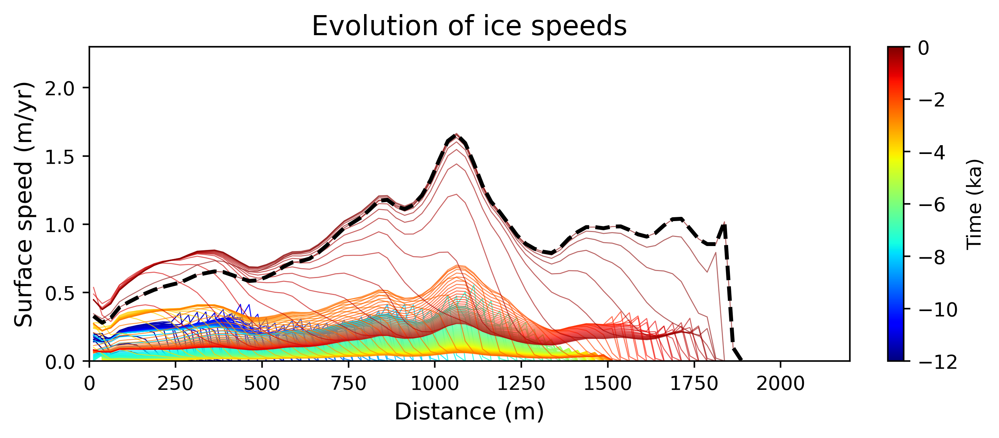

In [335]:
# plotting of ice speed profiles for Sopris paper

fig11, ax = plt.subplots(layout='constrained')
#fig11.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(0, 1), cmap='magma'),ax=ax, orientation='vertical', label='a colorbar label')
xframe = 7
zframe = 4
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)

from matplotlib.pyplot import cm
#color = iter(cm.rainbow(numpy.linspace(0, 1, nplots)))
color = iter(cm.jet(numpy.linspace(0, 1, nplots)))
#color = iter(cm.coolwarm(numpy.linspace(0, 1, nplots)))


for j in range(nplots):
#    pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],alpha=j/nplots,linewidth=1)
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),j/nplots,j/nplots],alpha=j/nplots,linewidth=1)
    
    #nmid = nplots/2
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),1-numpy.abs(j-nmid)/nmid,1*j/nplots],alpha=j/nplots,linewidth=1) 
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),1-numpy.abs(j-nmid)/nmid,1*j/nplots],linewidth=0.5) 

    ntwothird = 2*nplots/3
    nonethird = nplots/3
    gun1=0.5*(1+numpy.tanh(nonethird-j))
    gun3=0.5*(1+numpy.tanh(j-ntwothird))
    gun2 = 1 - gun1 - gun3
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[gun1,0.7*gun2,gun3],linewidth=0.5) 
    
#for i in range(n):
    cnext = next(color)
    #plt.plot(x, y, c=c)
    
    pylab.plot(x_edge,Us_plot[:,j],c=cnext,alpha=0.6+0.4*(nplots-j)/nplots,linewidth=0.5) 
    
    
    pylab.ylim(0,2.3)
    pylab.xlim(0,2200)
    pylab.xlabel('Distance (m)',fontsize=12)
    pylab.ylabel('Surface speed (m/yr)',fontsize=12)
    pylab.title("Evolution of ice speeds",fontsize = 14)
    pylab.grid()
    
pylab.plot(x_edge,Us_plot[:,j],'k--',linewidth=2)

#pylab.plot(x_sopris_speeds,Us_sopris_speeds,'r',linewidth=1)
#pylab.plot(x_sopris_speeds,Us_sopris_speeds-Us_sopris_speed_errs,'k',linewidth=1)
#pylab.plot(x_sopris_speeds,Us_sopris_speeds+Us_sopris_speed_errs,'k',linewidth=1)
#plt.fill_between(x_sopris_speeds, Us_sopris_speeds-Us_sopris_speed_errs, Us_sopris_speeds+Us_sopris_speed_errs, color='red', alpha=1)

#plt.colorbar()
#plt.colorbar(label="Color Ratio")

#fig11.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='coolwarm'), ax=ax, orientation='vertical', 
#               label='Time (ka)')

fig11.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='jet'), ax=ax, orientation='vertical', 
               label='Time (ka)')


#fig.colorbar(pos, ax=ax1)
#plt.tight_layout()

plt.savefig("model speed profiles_jet_july23.pdf")

pylab.show()

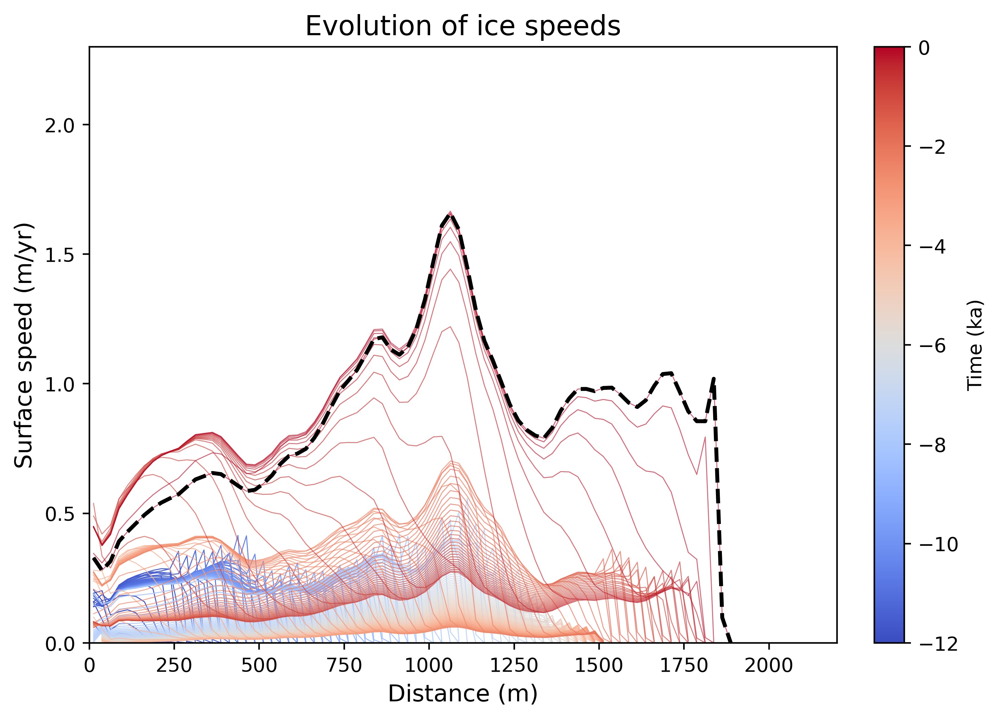

In [299]:
# old version of ice speed plots

fig11, ax = plt.subplots(layout='constrained')
#fig11.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(0, 1), cmap='magma'),ax=ax, orientation='vertical', label='a colorbar label')
xframe = 7
zframe = 4
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)

from matplotlib.pyplot import cm
#color = iter(cm.rainbow(numpy.linspace(0, 1, nplots)))
#color = iter(cm.jet(numpy.linspace(0, 1, nplots)))
color = iter(cm.coolwarm(numpy.linspace(0, 1, nplots)))


for j in range(nplots):
#    pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],alpha=j/nplots,linewidth=1)
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),j/nplots,j/nplots],alpha=j/nplots,linewidth=1)
    
    #nmid = nplots/2
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),1-numpy.abs(j-nmid)/nmid,1*j/nplots],alpha=j/nplots,linewidth=1) 
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),1-numpy.abs(j-nmid)/nmid,1*j/nplots],linewidth=0.5) 

    ntwothird = 2*nplots/3
    nonethird = nplots/3
    gun1=0.5*(1+numpy.tanh(nonethird-j))
    gun3=0.5*(1+numpy.tanh(j-ntwothird))
    gun2 = 1 - gun1 - gun3
    #pylab.plot(x_edge/1000,Us_plot[:,j],color=[gun1,0.7*gun2,gun3],linewidth=0.5) 
    
#for i in range(n):
    cnext = next(color)
    #plt.plot(x, y, c=c)
    
    pylab.plot(x_edge,Us_plot[:,j],c=cnext,alpha=0.6+0.4*(nplots-j)/nplots,linewidth=0.5) 
    
    
    pylab.ylim(0,2.3)
    pylab.xlim(0,2200)
    pylab.xlabel('Distance (m)',fontsize=12)
    pylab.ylabel('Surface speed (m/yr)',fontsize=12)
    pylab.title("Evolution of ice speeds",fontsize = 14)
    pylab.grid()
    
pylab.plot(x_edge,Us_plot[:,j],'k--',linewidth=2)

#pylab.plot(x_sopris_speeds,Us_sopris_speeds,'r',linewidth=1)
#pylab.plot(x_sopris_speeds,Us_sopris_speeds-Us_sopris_speed_errs,'k',linewidth=1)
#pylab.plot(x_sopris_speeds,Us_sopris_speeds+Us_sopris_speed_errs,'k',linewidth=1)
#plt.fill_between(x_sopris_speeds, Us_sopris_speeds-Us_sopris_speed_errs, Us_sopris_speeds+Us_sopris_speed_errs, color='red', alpha=1)

#plt.colorbar()
#plt.colorbar(label="Color Ratio")

fig11.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='coolwarm'), ax=ax, orientation='vertical', 
               label='Time (ka)')


#fig.colorbar(pos, ax=ax1)
#plt.tight_layout()

plt.savefig("model speed profiles_july23.pdf")

pylab.show()


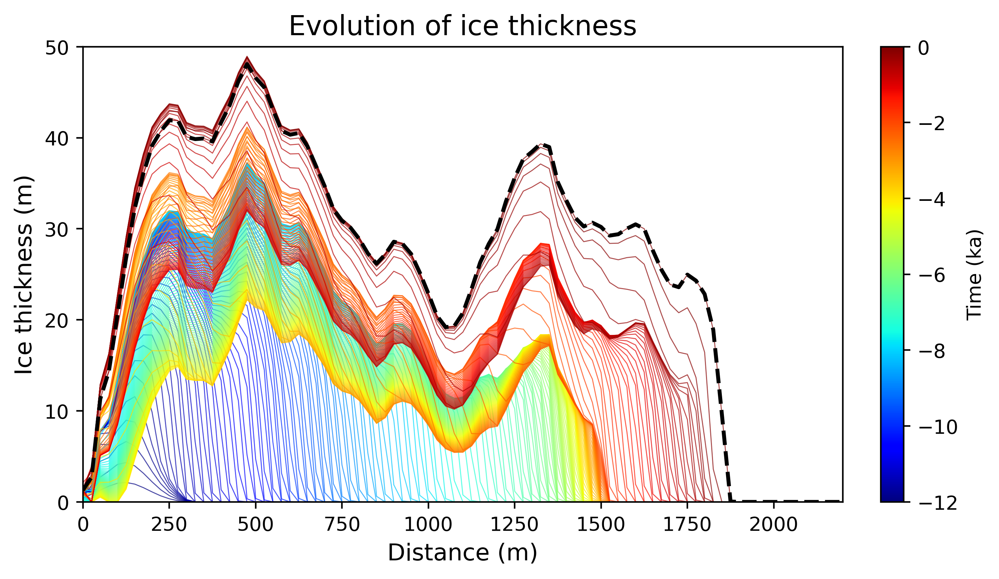

In [336]:
# plotting of ice thickness profiles for Sopris paper

fig12, ax = plt.subplots(layout='constrained')
xframe = 7
zframe = 4
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)

#color = iter(cm.rainbow(numpy.linspace(0, 1, nplots)))
color = iter(cm.jet(numpy.linspace(0, 1, nplots)))
#color = iter(cm.coolwarm(numpy.linspace(0, 1, nplots)))

for j in range(nplots):
#    pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],alpha=j/nplots,linewidth=1)
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),j/nplots,j/nplots],alpha=j/nplots,linewidth=1)
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),j/nplots,j/nplots],linewidth=1)
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),0.5,j/nplots],linewidth=1)    
    #nmid = nplots/2
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),1-numpy.abs(j-nmid)/nmid,1*j/nplots],linewidth=1) 
    
    ntwothird = 2*nplots/3
    nonethird = nplots/3
    gun1=0.5*(1+numpy.tanh(nonethird-j))
    gun3=0.5*(1+numpy.tanh(j-ntwothird))
    gun2 = 1 - gun1 - gun3
    #pylab.plot(x,H_profile[:,j],color=[gun1,0.7*gun2,gun3],alpha = 0.7,linewidth=0.5) 

    cnext = next(color)
    
    pylab.plot(x,H_profile[:,j],c=cnext,alpha=0.7,linewidth=0.5) 

        
    pylab.ylim(0,50)
    pylab.xlim(0,2200)
    pylab.xlabel('Distance (m)',fontsize=12)
    pylab.ylabel('Ice thickness (m)',fontsize=12)
    pylab.title("Evolution of ice thickness",fontsize = 14)
    pylab.grid()
    
pylab.plot(x,H_profile[:,j],'k--',linewidth=2)

#fig12.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='coolwarm'), ax=ax, orientation='vertical', 
#               label='Time (ka)')

fig12.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='jet'), ax=ax, orientation='vertical', 
               label='Time (ka)')

#fig12.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='rainbow'), ax=ax, orientation='vertical', 
#               label='Time (ka)')

#plt.tight_layout()

plt.savefig("model ice thickness profiles_jet_july23.pdf")

pylab.show()

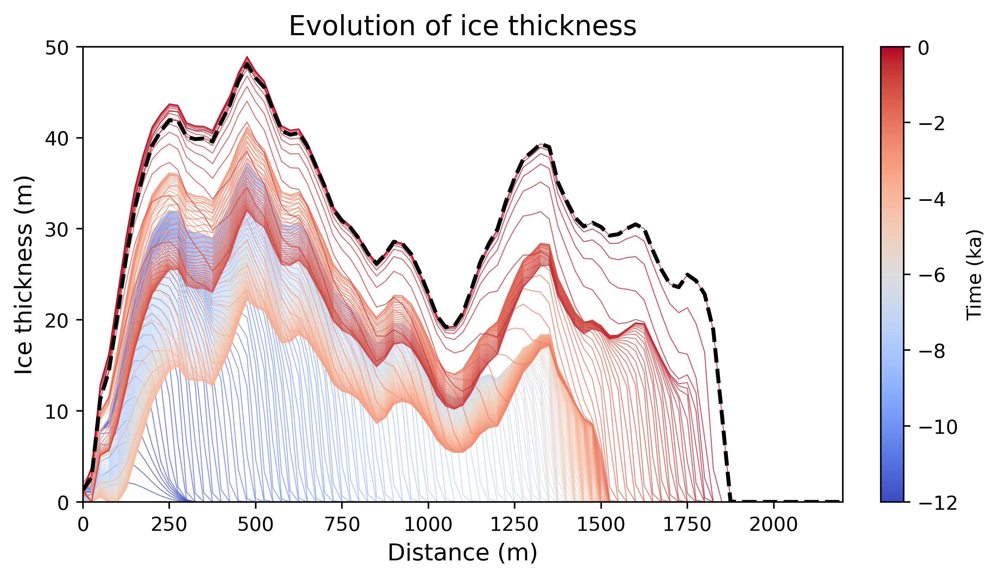

In [300]:
# old version of ice thickness profiles

fig12, ax = plt.subplots(layout='constrained')
xframe = 7
zframe = 4
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)

#color = iter(cm.rainbow(numpy.linspace(0, 1, nplots)))
#color = iter(cm.jet(numpy.linspace(0, 1, nplots)))
color = iter(cm.coolwarm(numpy.linspace(0, 1, nplots)))

for j in range(nplots):
#    pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],alpha=j/nplots,linewidth=1)
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),j/nplots,j/nplots],alpha=j/nplots,linewidth=1)
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),j/nplots,j/nplots],linewidth=1)
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),0.5,j/nplots],linewidth=1)    
    #nmid = nplots/2
    #pylab.plot(x/1000,H_profile[:,j],color=[1-(j/nplots),1-numpy.abs(j-nmid)/nmid,1*j/nplots],linewidth=1) 
    
    ntwothird = 2*nplots/3
    nonethird = nplots/3
    gun1=0.5*(1+numpy.tanh(nonethird-j))
    gun3=0.5*(1+numpy.tanh(j-ntwothird))
    gun2 = 1 - gun1 - gun3
    #pylab.plot(x,H_profile[:,j],color=[gun1,0.7*gun2,gun3],alpha = 0.7,linewidth=0.5) 

    cnext = next(color)
    
    pylab.plot(x,H_profile[:,j],c=cnext,alpha=0.7,linewidth=0.5) 

        
    pylab.ylim(0,50)
    pylab.xlim(0,2200)
    pylab.xlabel('Distance (m)',fontsize=12)
    pylab.ylabel('Ice thickness (m)',fontsize=12)
    pylab.title("Evolution of ice thickness",fontsize = 14)
    pylab.grid()
    
pylab.plot(x,H_profile[:,j],'k--',linewidth=2)

fig12.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='coolwarm'), ax=ax, orientation='vertical', 
               label='Time (ka)')

#fig12.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(-12,0), cmap='jet'), ax=ax, orientation='vertical', 
#               label='Time (ka)')

#plt.tight_layout()

plt.savefig("model ice thickness profiles_july23.pdf")

pylab.show()

In [301]:
# set up the movie of the speed profiles

# plotting
fig6 = plt.figure()
ax = plt.axes()
xframe = 9
zframe = 3
plt.rcParams["figure.figsize"] = [xframe,zframe] # (w, h)


with writer.saving(fig6, "RG_soliton_Sopris_July23_2024_rand_1_E3_b1mm_D1p0_0pct_speeds.mp4", dpi_movie):


    for j in range(nplots):
        #plt.clf()
        #if j==nplots-1:
            #pylab.plot(x_edge/1000,Us_plot[:,j],'k--',linewidth=2)
        #else:
            #pylab.plot(x_edge/1000,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],alpha=j/nplots,linewidth=1)
        pylab.plot(x_edge,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],linewidth=2)
        pylab.plot(x_edge,Us_plot[:,j],color=[1-(j/nplots),0.5,j/nplots],linewidth=2)
        
  
        pylab.ylim(0,2.2)
        pylab.xlim(0,2200)
        pylab.xlabel('Distance (km)',fontsize=12)
        pylab.ylabel('Surface speed (m/yr)',fontsize=12)
            #pylab.title("Evolution of ice speeds",fontsize = 12)
            
        ttext2 = str(numpy.int_(tmax-((j+1)*tplot))) + ' years bp'
            #plt.text(0.7*xmax/1000,max(zb)-200,'years bp',fontsize=12)
        plt.text(0.6*xmax,0.8*2.2,ttext2,fontsize=12)
            
        #pylab.grid()        
        plt.title('Evolution of ice speeds')
        plt.tight_layout()

        writer.grab_frame()
        plt.clf()
    
pylab.show()    


<Figure size 2800x1600 with 0 Axes>

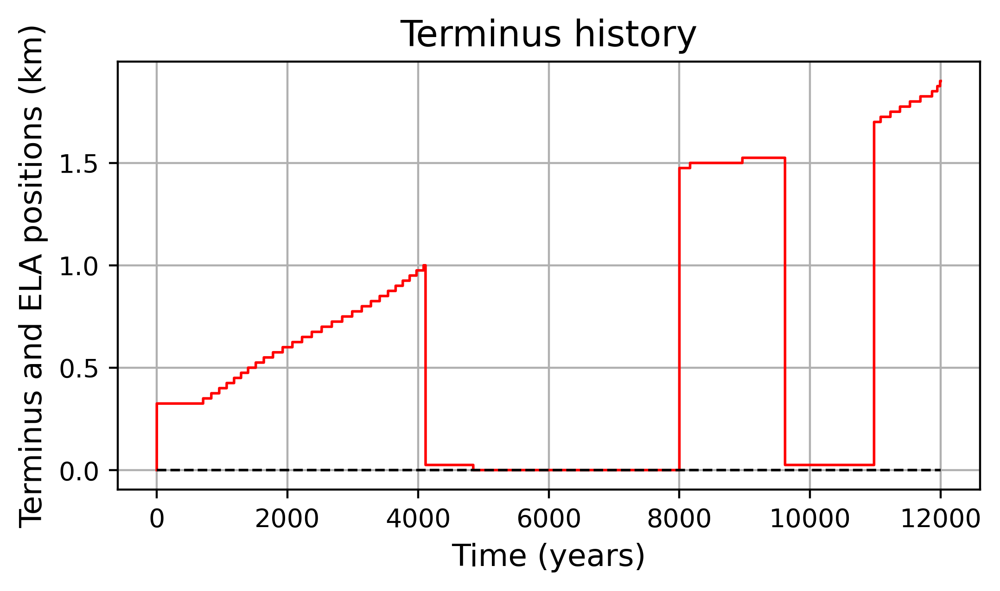

In [303]:
pylab.plot(t,xterm/1000, 'r',linewidth=1)
pylab.plot(t,x_ELA/1000, 'k--',linewidth=1)
#ttext = str(numpy.int_(t[i]) + ' years')
#pylab.text(3000,15,ttext,fontsize=14)
pylab.xlabel('Time (years)',fontsize=12)
pylab.ylabel('Terminus and ELA positions (km)',fontsize=12)
pylab.title("Terminus history",fontsize = 14)
pylab.grid()
pylab.show()

# References

- Anderson, R.S. and Anderson, S.P., 2010, Geomorphology: The Mechanics and Chemistry of Landscapes, Cambridge University Press
- Anderson, R.S., M. Dühnforth, W. Colgan, and L. Anderson, 2012, Far-flung moraines: Exploring the feedback of glacial erosion on the evolution of glacier length, Geomorphology 179: 269-285. doi:10.1016/j.geomorph.2012.08.018
- Anderson, R.S., P. Molnar, and M.A. Kessler, 2006, Features of glacial valley profiles simply explained, J. Geophys. Res., 111, F01004, doi:10.1029/2005JF000344.
- Cuffey, K. and W.S.B. Paterson, 2010, The Physics of Glaciers, 4th edition.
- Hooke, R. LeB., 2005, Principles of Glacier Mechanics, 2nd edition, Cambridge: Cambridge University Press.
- MacGregor, K.R., Anderson, R.S., Anderson, S.P., and Waddington, E.D., 2000, Numerical simulations of glacial-valley longitudinal profile evolution.  Geology 28: 1031.
- MacGregor, K.R., R.S. Anderson, E.D. Waddington, 2008, Numerical modeling of glacial erosion and headwall processes in alpine valleys, Geomorphology, doi:10.1016/j.geomorph.2008.04.022



In [304]:
numpy.mean(H)

22.790920297629647

In [305]:
max(H)

48.08891569575069

In [306]:
max(U_surface)


1.6584507765683303

In [307]:
x_edge.size,U_surface.size

(100, 100)

In [308]:
print("nframe = ",nframe)

nframe =  199


In [309]:
Q0= 100
S0 = 0.17
A = A0 * Enhance  # enhancement factor for dirty ice
H0 = (Q0/(A*((rho_i*g)**3)*(S0**3)))**(1/5)
H0

41.50303156586767

In [310]:
# now analytic solution for how the soliton should extend
# added July 6th 2023
# for use in Appendix of the Sopris paper

# conserve volume by (x0+Dx)H = x0H0
# assume speed goes as H^4
# uniform slope

u0 = 1
H0 = 30
x0 = 1000
Agemax = x0/u0

Ages2 = numpy.arange(0,Agemax,Agemax/20)
xAges2 = numpy.arange(0,Agemax*u0,Agemax*u0/20)

dt = 1
tmax = 12000
t = numpy.arange(0,tmax,dt)
nmax = len(t)

u_plot = numpy.zeros(len(t))
H_plot = numpy.zeros(len(t))
Dx_plot = numpy.zeros(len(t))

Dx = 0

L_anal = x0 * (1+(5*t*u0/x0))**(1/5)

for n in range (nmax):
    u = u0*(1/(1+(Dx/x0)))**4
    Dx = Dx+(u*dt)

    Dx_plot[n] = Dx
    u_plot[n] = u
    H_plot[n] = H0*(x0/(x0+Dx))
    
    ageadd =  numpy.array([0])
    Ages2 = numpy.concatenate((ageadd, Ages2), axis=None)
    Ages2 = Ages2 + dt
    
    xageadd =  numpy.array([0])
    xAges2 = numpy.concatenate((xageadd, xAges2), axis=None)    
    xAges2 = xAges2 + (dt*u)

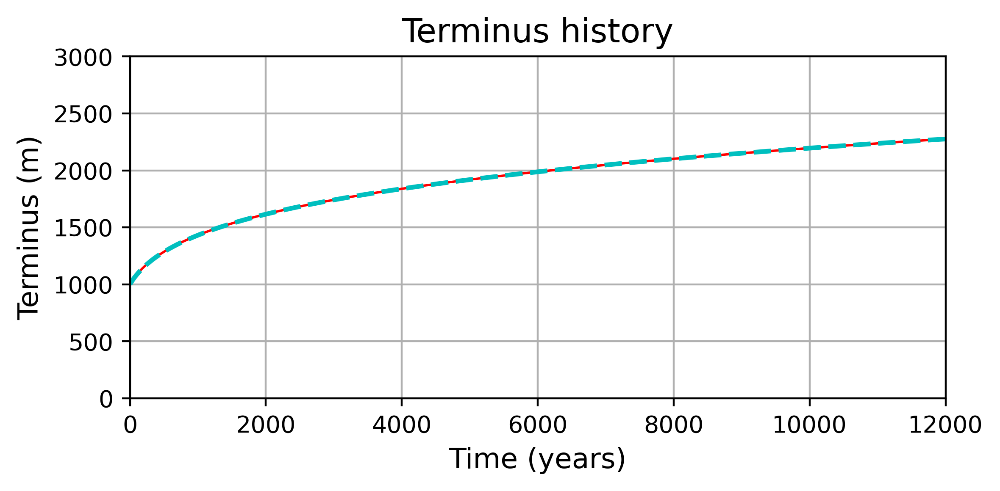

In [311]:
pylab.plot(t,x0+Dx_plot, 'r',linewidth=1)
pylab.plot(t,L_anal, 'c--',linewidth=2)

pylab.xlabel('Time (years)',fontsize=12)
pylab.ylabel('Terminus (m)',fontsize=12)
pylab.title("Terminus history",fontsize = 14)
pylab.xlim(0,tmax)
pylab.ylim(0,3*x0)
pylab.grid()

plt.tight_layout()
#plt.savefig("analytic length history.pdf")

pylab.show()

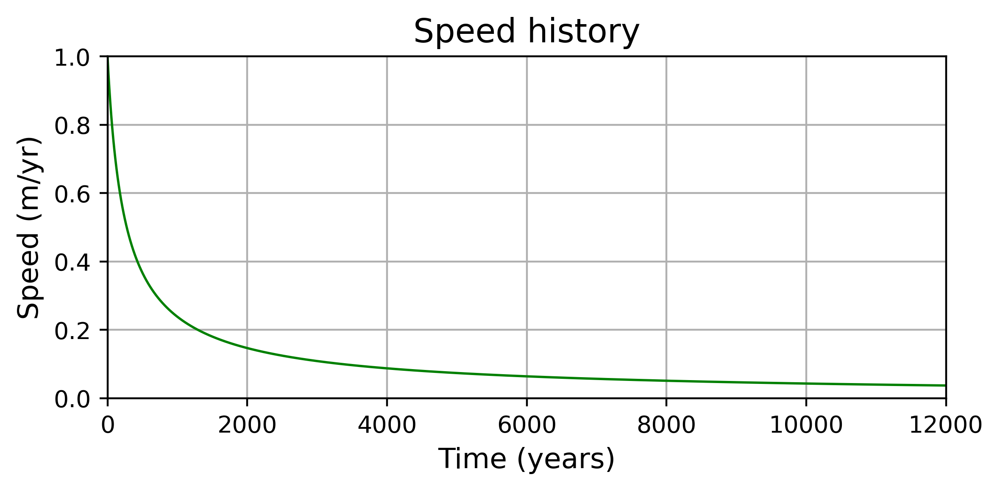

(2164.042561333445, -2.772588722239781)

In [312]:
t_star0 = -6*(x0/u0)/numpy.log(1/16)


Uexp = u0 * numpy.exp(-(t/t_star0))

#Uexp = u0 * numpy.exp(-(t/(t_star))
#pylab.plot(t,Uexp, 'r--',linewidth=1) # shows that an exp cannot capture this decay in speed

pylab.plot(t,u_plot, 'g',linewidth=1)
pylab.xlabel('Time (years)',fontsize=12)
pylab.ylabel('Speed (m/yr)',fontsize=12)
pylab.title("Speed history",fontsize = 14)
pylab.xlim(0,tmax)
pylab.ylim(0,u0)
pylab.grid()

plt.tight_layout()
#plt.savefig("analytic speed history.pdf")
pylab.show()

t_star0, numpy.log(1/16)

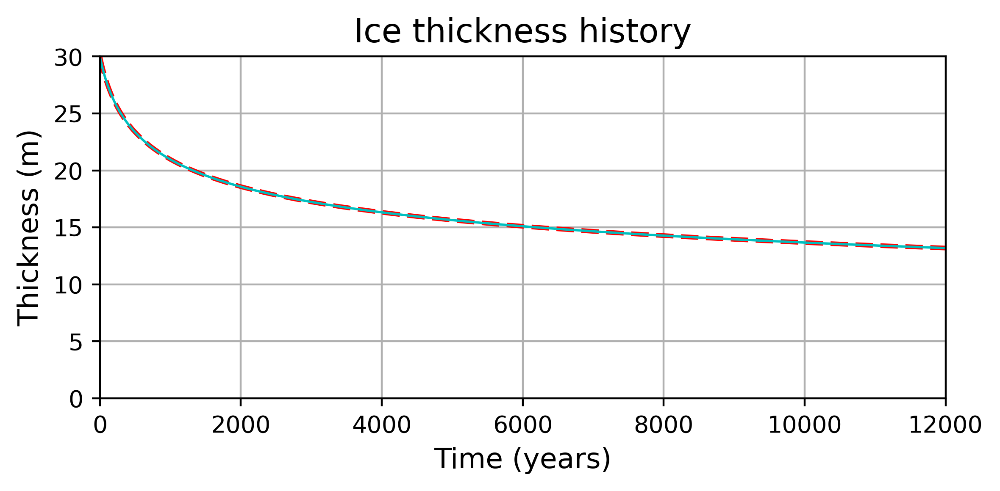

In [313]:

# attempt at analytic soln 11/7/23

H_anal = H0* (1/(((5*u0*t/x0)+1)))**(1/5)

pylab.plot(t,H_anal,'r--',linewidth=2)
pylab.plot(t,H_plot, 'c',linewidth=1)
pylab.xlabel('Time (years)',fontsize=12)
pylab.ylabel('Thickness (m)',fontsize=12)
pylab.title("Ice thickness history",fontsize = 14)
pylab.xlim(0,tmax)
pylab.ylim(0,H0)
pylab.grid()

plt.tight_layout()
#plt.savefig("analytic thickness history.pdf")


pylab.show()

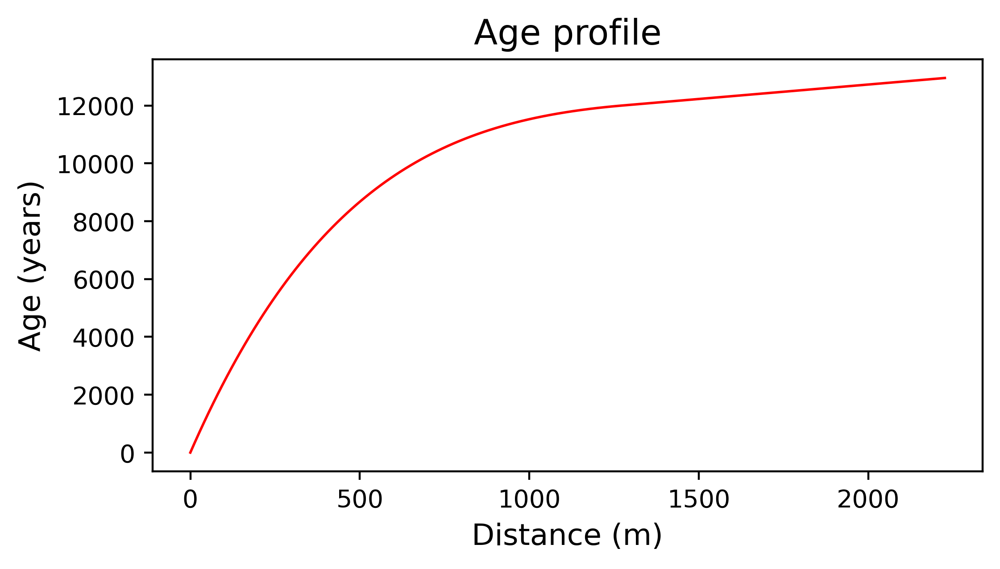

In [314]:
pylab.plot(xAges2,Ages2, 'r',linewidth=1)
pylab.xlabel('Distance (m)',fontsize=12)
pylab.ylabel('Age (years)',fontsize=12)
pylab.title("Age profile",fontsize = 14)
pylab.show()
#pylab.xlim(0,tmax)
#pylab.ylim(0,H0)

In [332]:
# calculate required thickness of ice to change when we change the bulk density of the ice core
# must maintain the measured surface speeds

# Us ~ density ^3

rho1 = rho_i*(1-0.0) + (rho_rock * 0.0)
rho2 = rho_i*(1-0.1) + (rho_rock * 0.1)

R = rho1/rho2
Rh = (rho1/rho2)**(-3/4) # this is the ratio of thickensses needed to achieve the same speed?

R,Rh

(0.833409070253567, 1.146453205581502)

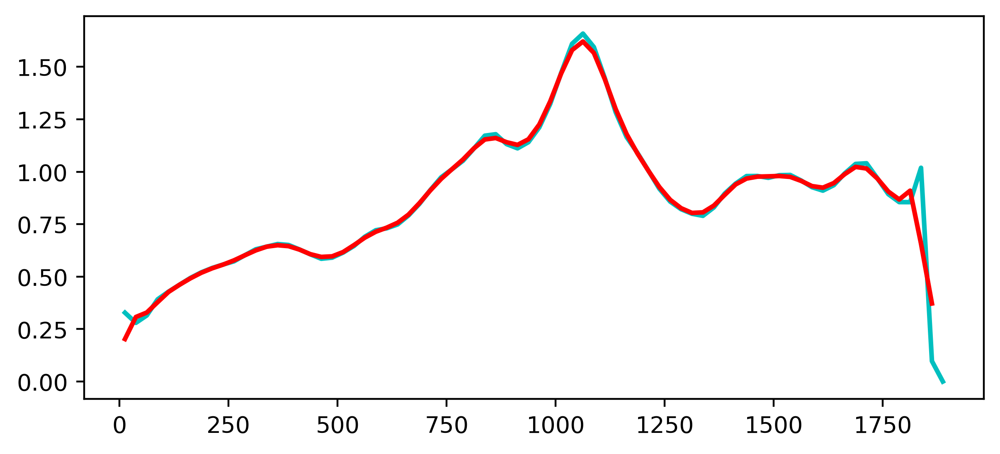

In [333]:
# try to smooth out the speed plot

pylab.plot(x_edge,U_surface, 'c',linewidth=2)

box_pts = 3
box = numpy.ones(box_pts)/box_pts
Us_smooth = numpy.convolve(U_surface, box, mode='same')

pylab.plot(x_edge,Us_smooth, 'r',linewidth=2)


In [334]:
end = time.time()
 
# print the difference between start 
# and end time in secs

print("The time of execution of above program is :", (end-start) , "seconds")


The time of execution of above program is : 178.86340379714966 seconds
